# Refining Component 

#### In this notebook, we will go through each component in order to refine them and to have more biological concordant component based on Elli's rules

##### We start with the dataset containing the initial components from the first HDP as well as the new components from second HDP to reassign component 0,2 and 4.
##### We also have the second maximal probability of assignment as well as the second predicted component to help us refining components

In [1]:
library(ggplot2)
library(gridExtra)
library(matrixStats)
library(dplyr)
library(reshape2)
library(ggpubr)
library(tidyverse)
source('../../../src/tools.R')     # custom tools function
source('../../../src/hdp_tools_yanis.R')


Attaching package: ‘dplyr’

The following object is masked from ‘package:matrixStats’:

    count

The following object is masked from ‘package:gridExtra’:

    combine

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: magrittr
── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ tibble  2.1.1     ✔ purrr   0.3.2
✔ tidyr   0.8.3     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.4.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::combine()   masks gridExtra::combine()
✖ dplyr::count()     masks matrixStats::count()
✖ tidyr::extract()   masks magrittr::extract()
✖ dplyr::filter()    masks stats::filter()
✖ dplyr::lag()       masks stats::lag()
✖ purrr::set_names() masks magrittr::set_names()
Run citation('hdp') for citation instructions,
    and file.show(system.file('LI

In [2]:
df_refine <- read.table("all_components_with_second_complex_inv3.tsv")
df_refine$translated_second_predicted_component <- apply(df_refine, 1, function(x) { if (all(is.na(x['second_predicted_component'])))
                                                                                  return(NaN)
                                                                             else return(ifelse(x['second_predicted_component']==1,"C1",
                                                                                         ifelse(x['second_predicted_component']==3,"C2",
                                                                                         ifelse(x['second_predicted_component']==5,"C3",
                                                                                         ifelse(x['second_predicted_component']==6,"C4",
                                                                                         ifelse(x['second_predicted_component']==7,"C5",
                                                                                         ifelse(x['second_predicted_component']==8,"C6",
                                                                                         ifelse(x['second_predicted_component']==9,"C7",
                                                                                         ifelse(x['second_predicted_component']==10,"C8","others"
                                                                                         )))))))))
                                                                            })
min_proba_c1 = min(df_refine[df_refine$predicted_component=="C1",]$max_proba)
min_proba_c2 = min(df_refine[df_refine$predicted_component=="C2",]$max_proba)
min_proba_c3 = min(df_refine[df_refine$predicted_component=="C3",]$max_proba)
min_proba_c4 = min(df_refine[df_refine$predicted_component=="C4",]$max_proba)
min_proba_c5 = min(df_refine[df_refine$predicted_component=="C5",]$max_proba)
min_proba_c6 = min(df_refine[df_refine$predicted_component=="C6",]$max_proba)
min_proba_c7 = min(df_refine[df_refine$predicted_component=="C7",]$max_proba)
min_proba_c8 = min(df_refine[df_refine$predicted_component=="C8",]$max_proba)

# Takeaways

### [Summary refining Component 1](#summary1)

### [Summary refining Component 2](#summary2)

### [Summary refining Component 3](#summary3)

### [Summary refining Component 4-5](#summary4-5)

### [Summary refining Component 6](#summary6)

### [Summary refining Component 7](#summary7)

### [Summary refining Component 8](#summary8)

### [Summary refining New Components ](#summarynew)

### [Features frequency and activation map for refined components ](#plots)

 # Refining Component 1

In [3]:
study_c1 <- df_refine[df_refine$predicted_component=="C1",]
dim(study_c1)

[1] 851 158

##### Let's look at how many patients have mutations NPM1 within component 1

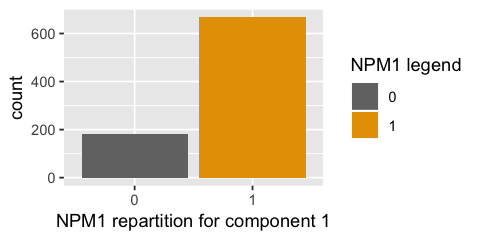

In [4]:
set_notebook_plot_size(4,2)
ggplot(study_c1) +
geom_bar(aes(x = as.factor(NPM1), fill = as.factor(NPM1)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("0" = "grey45", "1" = "#e79f00"))+
xlab("NPM1 repartition for component 1")+guides(fill=guide_legend("NPM1 legend"))


##### Let's try to reassign patients that do not have NPM1 mutation to another component:

##### First, let's look at the repartition of the second predicted component for those patients who are not in initial component 0,2 and 4
##### Others are the ones coming from component 0,2 and 4

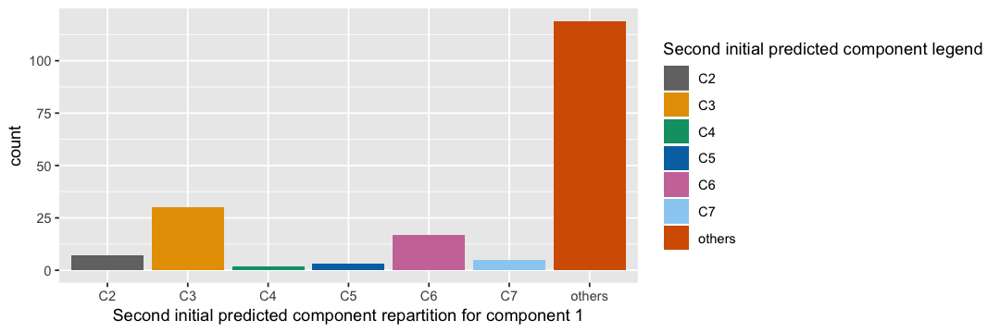

In [5]:
set_notebook_plot_size(9,3)
ggplot(study_c1[study_c1$NPM1==0,]) +
geom_bar(aes(x = as.factor(translated_second_predicted_component), fill = as.factor(translated_second_predicted_component)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
xlab("Second initial predicted component repartition for component 1")+guides(fill=guide_legend("Second initial predicted component legend"))

##### Unfortunately for those in initial component 0,2 and 4 labeled others , we will not be able to reassign them because we have applied an other HDP on those components. Let's look at those in C2,...,C7.

##### As we can expect, the probability when NPM1 is 1 is much higher for assignment to component 1. The good news is that when NPM1 is not mutated ,
##### the second max probability is still high so we will define some rules to see whether or not we can reassign to second best predicted component

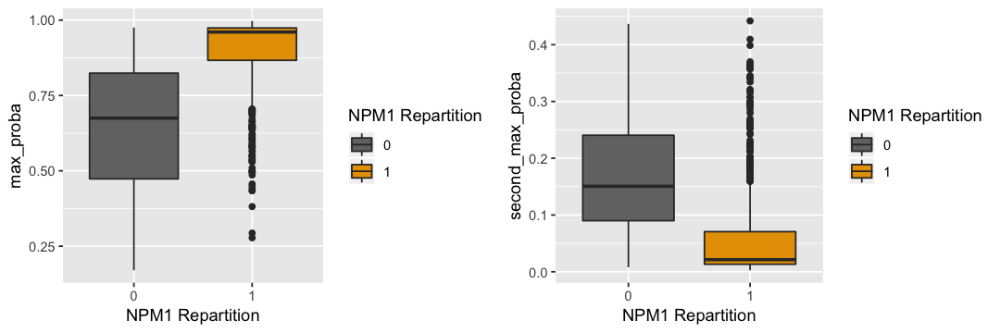

In [6]:
p1 <-ggplot(study_c1,aes(x=factor(NPM1),y=max_proba,fill=factor(NPM1))) +
    geom_boxplot(aes(fill = factor(NPM1)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NPM1 Repartition"))+
    xlab("NPM1 Repartition")
p2 <-ggplot(study_c1,aes(x=factor(NPM1),y=second_max_proba,fill=factor(NPM1))) +
    geom_boxplot(aes(fill = factor(NPM1)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NPM1 Repartition"))+
    xlab("NPM1 Repartition")
grid.arrange(p1,p2,nrow=1)

[1] "Number of patients NPM1 wt in component 1 : 183"

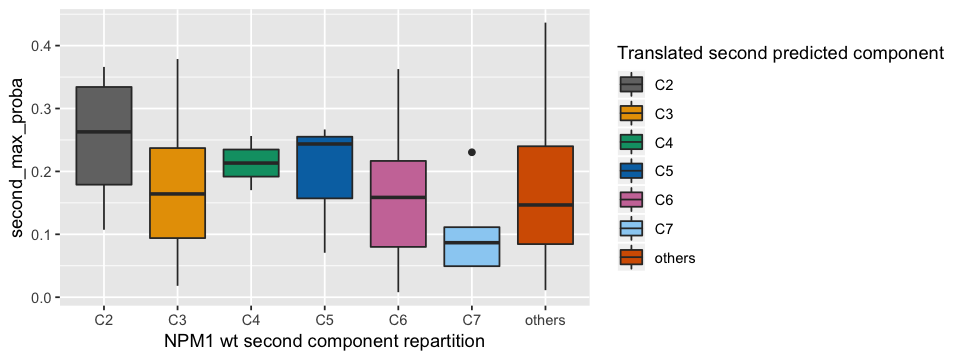

In [7]:
set_notebook_plot_size(8,3)
paste("Number of patients NPM1 wt in component 1 : ",dim(study_c1[study_c1$NPM1==0,])[1],sep="")
ggplot(study_c1[study_c1$NPM1==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("NPM1 wt second component repartition")

##### For patients in component 1 with NPM1 wt where second predicted component is 0,2 and 4 , we will not be able to reassign them so we will create a component called : not assigned where we will include them among others.
##### For other patients in component 1 without NPM1, we will assign them to second predicted component if the second max proba is greater than 75% the min(max proba ) of patients that were assigned to this component. 

In [8]:
df_refine$final_component <- "not_assigned"
df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==1,]$final_component <-"C1"
df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==0,]$final_component  <- apply(df_refine[df_refine$predicted_component=="C1" & df_refine$NPM1==0,], 1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C2" & x['second_max_proba']>=0.75*min_proba_c2,"C2",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3,"C3",
                   ifelse(x['translated_second_predicted_component']=="C4" & x['second_max_proba']>=0.75*min_proba_c4,"C4",
                   ifelse(x['translated_second_predicted_component']=="C5" & x['second_max_proba']>=0.75*min_proba_c5,"C5",
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6,"C6",
                   ifelse(x['translated_second_predicted_component']=="C7" & x['second_max_proba']>=0.75*min_proba_c7,"C7",
                   ifelse(x['translated_second_predicted_component']=="C8" & x['second_max_proba']>=0.75*min_proba_c8,"C8","not_assigned"))))))))
    })
df_refine$second_final_component <- "not_assigned"
df_refine$overlap <-0

In [9]:
table(df_refine$NPM1)


   0    1 
1412  682 

### We add all other patients NPM1 mutated (only 14 that are not in C1)

In [10]:
df_refine[df_refine$NPM1==1,]$final_component <- "C1"
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682            5           13            1            2            9 
          C7 not_assigned 
           1         1381 

<a id='summary1'></a>
#### Summary Component 1: 
##### We started with 851 patients in component 1 with 668 NPM1 mutated and 183 NPM1 wt .
##### We removed NPM1 wt from component 1 and try to reassign them if probability high enough to there second best component. We were able to reassign 31 out of 183 of them and put the other in a new component called not assigned.
##### We then added all other patients with NPM1 mutations(14 not in component 1 with this mutation in the whole cohort).
##### At the end, we switch from 851 patients in component 1 with: 682 patients in component 1, 31 reassigned between component 2 to 7 and 152 not assigned.
##### They were 2 patients in component 8 with NPM1 that we will remove later from component 1 because they have specific mutations BAGE3 and KMT2C more important.

# Refining Component 2

##### We start by associating final component with C2 for patients in C2 not assigned and will add rules after.

In [11]:
df_refine[df_refine$predicted_component =="C2" & df_refine$final_component =="not_assigned",]$final_component <- "C2"
# There is one patient with NPM1 mutation that we have lost in refining component 1
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          228           13            1            2            9 
          C7 not_assigned 
           1         1158 

In [12]:
study_c2 <- df_refine[df_refine$final_component=="C2",]
dim(study_c2)

[1] 228 161

# 1- Include all cases TP53 and complex:

##### Good news is that there is only one patient with TP53 and complex that is not in component 2 . We will start by adding this patient.

In [13]:
table(df_refine[df_refine$TP53==1 & df_refine$complex==1,]$predicted_component)


 C1  C2  C3  C4  C5  C6  C7  C8 NC1 NC2 NC3 NC4 NC5 NC6 NC7 
  0 143   0   0   0   0   0   0   0   0   1   0   0   0   0 

In [14]:
df_refine[df_refine$TP53==1 & df_refine$complex==1 & df_refine$final_component =="not_assigned",]$final_component <- "C2" 
# we add not assigned to make sure it was not a specific rule like NPM1 mutated needed to be in first component
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          229           13            1            2            9 
          C7 not_assigned 
           1         1157 

# 2- Check cases TP53 wt,complex wt with plus8 and one aneuploidy in component 2 in order to reassign them if possible

In [15]:
#study_c2[study_c2$TP53==0 & study_c2$add_8==1 & study_c2$complex==0 ,c(84:99,155)]
study_c2[c('PD22833a','PD23249c'),]

,ASXL1,ASXL2,ASXL3,ATRX,BAGE3,BCOR,BRAF,CBFB,CBL,CDKN2A,⋯,second_predicted_component,max_proba,second_max_proba,complex,inv_3,predicted_component,translated_second_predicted_component,final_component,second_final_component,overlap
PD22833a,0,0,0,0,0,0,0,0,0,0,⋯,0,0.3166667,0.2353333,0,0,C2,others,C2,not_assigned,0
PD23249c,0,0,0,0,0,0,0,0,0,0,⋯,7,0.2980000,0.2733333,0,0,C2,C5,C2,not_assigned,0


[1] "Number of patients TP53 wt with plus 8 : 15"

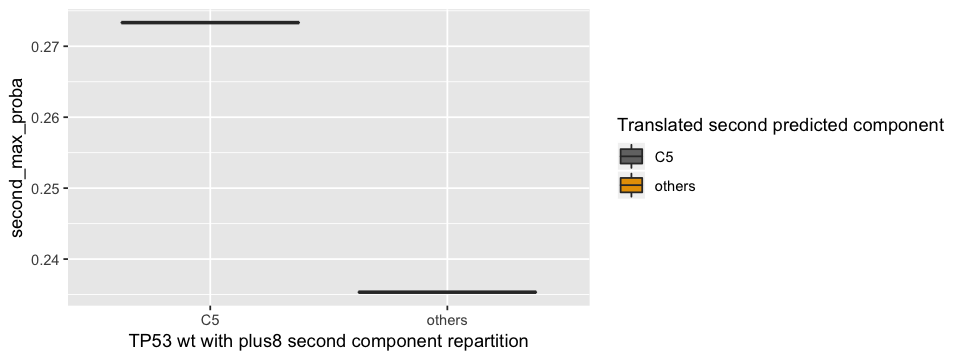

In [16]:
paste("Number of patients TP53 wt with plus 8 : ",dim(study_c2[study_c2$TP53==0 & study_c2$add_8==1,])[1],sep="")
set_notebook_plot_size(8,3)
ggplot(study_c2[c('PD22833a','PD23249c'),],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("TP53 wt with plus8 second component repartition")

#####  Let's try to reassign those cases
We will not consider to reassign in component 1 because we are done with this one.
We have final component initialised with all people in C2 and all people with TP53 and complex mutation. We now remove people TP53 wt with plus8 and try to reassign them

In [17]:
df_refine[c('PD22833a','PD23249c'),]$final_component  <- apply(df_refine[c('PD22833a','PD23249c'),] ,1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3,"C3",
                   ifelse(x['translated_second_predicted_component']=="C4" & x['second_max_proba']>=0.75*min_proba_c4,"C4",
                   ifelse(x['translated_second_predicted_component']=="C5" & x['second_max_proba']>=0.75*min_proba_c5,"C5",
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6,"C6",
                   ifelse(x['translated_second_predicted_component']=="C7" & x['second_max_proba']>=0.75*min_proba_c7,"C7",
                   ifelse(x['translated_second_predicted_component']=="C8" & x['second_max_proba']>=0.75*min_proba_c8,"C8","not_assigned")))))))
    })

In [18]:
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          227           13            1            3            9 
          C7 not_assigned 
           1         1158 

In [19]:
df_refine[df_refine$final_component !="C2" & df_refine$predicted_component =="C2",c('TP53','complex')]
# no need to add second final component because the 3 people that were reassigned do not have TP53 or complex which is the main characteristic for this component.

,TP53,complex
PD22833a,0,0
PD23249c,0,0
PD25562a,0,0


<a id='summary2'></a>
#### Summary Component2:
##### We started with 5 patients coming from reassignement with second predicted component , we added all other patients with predicted second component
##### that were not there yet(223 and we lost one because NPM1 mutated) and we added the only patient not in component 2 with TP53 and complex.
##### At this point it means 229 patients in component 2 and now we need to check that those patients are not (TP53 wt, complex wt and with one aneuploidy combined with plus8). We found 2 of them that we reassigned. 
##### Finally, we have 227 patients in final component 2 .


# 3- Refining Component 3

##### We start by associating final component with C3 for patients in C3 not assigned and will add rules after.
##### Initially, there are 136 with 3 that were reassigned to component 1 because of NPM1 mutation.

In [20]:
df_refine[df_refine$predicted_component =="C3" & df_refine$final_component =="not_assigned",]$final_component <- "C3"

In [21]:
table(df_refine$final_component)


          C1           C2           C3           C4           C5           C6 
         682          227          146            1            3            9 
          C7 not_assigned 
           1         1025 

In [22]:
study_c3 <- df_refine[df_refine$final_component=="C3",]
study_c3$t11 <- pmin(study_c3$t_v_11 + study_c3$t_9_11,1)
study_c3$charac <- ifelse(study_c3$t11==1,"t11",
                         ifelse(study_c3$t_15_17==1,"t15_17","others"))

# 1- We will have to split this component into 3 components: one for t(11) , one for t(15,17), one for others.
##### First, let's look at second predicted component and second max proba repartition for cases without those translations in component 3

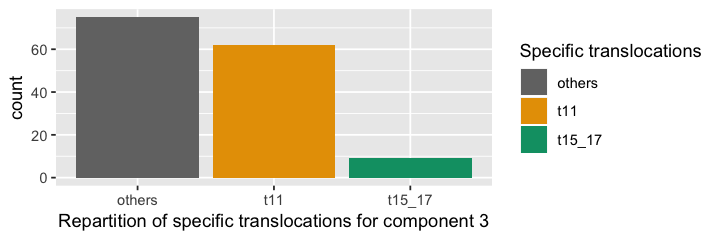

In [23]:
set_notebook_plot_size(6,2)
ggplot(study_c3)+geom_bar(aes(x=factor(charac),fill=factor(charac)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00", "#009E73"))+
xlab("Repartition of specific translocations for component 3")+guides(fill=guide_legend("Specific translocations"))

### Let's do the split repartition of component 3:

In [24]:
# we start by adding the feature t11 corresponding to wheter or not t_9_11 or t_v_11 is present
df_refine$t11 <- pmin(df_refine$t_v_11 + df_refine$t_9_11,1)
df_refine[df_refine$final_component=="C3",]$final_component <- apply(df_refine[df_refine$final_component=="C3",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['t11']==1,"C3_t11",
                   ifelse(x['t_15_17']==1,"C3_t15_17","C3_others")))
    })

In [25]:
table(df_refine$final_component)


          C1           C2    C3_others       C3_t11    C3_t15_17           C4 
         682          227           75           62            9            1 
          C5           C6           C7 not_assigned 
           3            9            1         1025 

# 2- Let's refine C3_others

In [26]:
df_refine$rare_fusion <- rowSums(df_refine[,100:150])

In [27]:
study_c3_others <- df_refine[df_refine$final_component =="C3_others",]

In [28]:

#study_c3_others$rare_fusion <-rowSums(study_c3_others[,100:150])
study_c3_others$charac <- ifelse(study_c3_others$complex==1 & study_c3_others$rare_fusion==0,"complex_only",
                               ifelse(study_c3_others$complex==1 & study_c3_others$rare_fusion>=1,"complex_rare_fusion",
                               ifelse(study_c3_others$complex==0 & study_c3_others$rare_fusion>=1,"rare_fusion_only","none")))
table(study_c3_others$charac)


       complex_only complex_rare_fusion                none    rare_fusion_only 
                 16                   3                  44                  12 

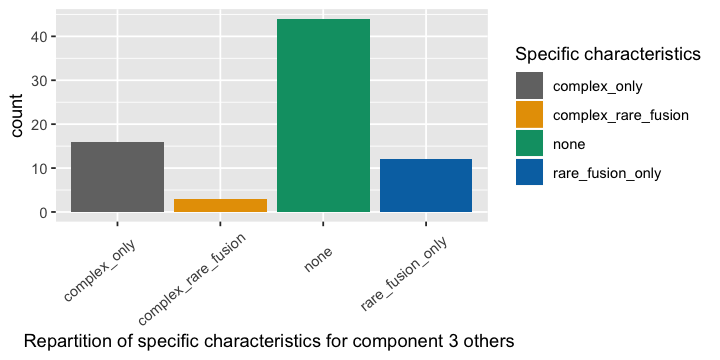

In [29]:
set_notebook_plot_size(6,3)
ggplot(study_c3_others)+geom_bar(aes(x=factor(charac),fill=factor(charac)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2"))+
xlab("Repartition of specific characteristics for component 3 others ")+guides(fill=guide_legend("Specific characteristics"))+theme(axis.text.x = element_text(angle = 40, hjust = 0.8,vjust=0.8)) 

#### Let's check differences when we integrate all fusions for patients in this component to see if it worth it to integrate all them instead of only integrating the most frequent

In [30]:
df_initial <- read.table("../../../data/initial_dataset/Master_04_10_2019.csv",sep = ',' , header = T)
rownames(df_initial) <- df_initial$data_pd
df_initial <- df_initial[,-1:-4]
tmp_study <- merge(study_c3_others[,c("complex","charac","rare_fusion")],df_initial[,c(123,367:475)],by=0)
tmp_study$Row.names <- NULL

In [31]:
tmp_study$rare_fusion_bis <- rowSums(tmp_study[,4:113])
tmp_study[tmp_study$rare_fusion != tmp_study$rare_fusion_bis ,]

,complex,charac,rare_fusion,t_v_11,t_10_13,t_10_19,t_10_21,t_12_13,t_12_14,t_12_15,⋯,t_9_21,t_9_22,t_x_1,t_x_12,t_x_15,t_x_16,t_x_21,t_x_5,t_x_y,rare_fusion_bis
42,0,rare_fusion_only,3,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,4
48,0,rare_fusion_only,1,0,0,1,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,3


#### Conclusion:  It is not worth it to do so because there are only 2 patients where it changes and those patients are already categorised as rare fusion.

##### We will place patients with complex only in C2 , create a new component rare fusion , and allocate patients in complex and rare fusion in rare fusion for first final component and C2 for the second.

In [32]:
df_refine[df_refine$final_component =="C3_others" & rowSums(df_refine[,100:150])>=1 ,]$final_component <-"C3_rare_fusion"
df_refine[df_refine$final_component =="C3_rare_fusion" & df_refine$complex==1,]$second_final_component <-"C2"
df_refine[df_refine$final_component =="C3_others" & df_refine$complex==1 ,]$final_component <-"C2"


In [33]:
table(df_refine$second_final_component)
table(df_refine$final_component)


          C2 not_assigned 
           3         2091 


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17             C4             C5             C6             C7 
             9              1              3              9              1 
  not_assigned 
          1025 

##### Now let's check the ones with NPM1 to see overlap of assignment: (3 patients)

In [34]:
df_refine[df_refine$predicted_component =="C3" & df_refine$NPM1==1,]$second_final_component <- ifelse(df_refine[df_refine$predicted_component =="C3" & df_refine$NPM1==1,]$t11==1,"C3_t11",
                                                                                               ifelse(df_refine[df_refine$predicted_component =="C3" & df_refine$NPM1==1,]$t_15_17==1,"C3_t15_17",
                                                                                               ifelse(df_refine[df_refine$predicted_component =="C3" & df_refine$NPM1==1,]$rare_fusion>=1,"C3_rare_fusion",
                                                                                               ifelse(df_refine[df_refine$predicted_component =="C3" & df_refine$NPM1==1,]$complex==1,"C2","not_assigned"))))
table(df_refine$second_final_component)
table(df_refine$final_component)


            C2 C3_rare_fusion   not_assigned 
             4              2           2088 


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17             C4             C5             C6             C7 
             9              1              3              9              1 
  not_assigned 
          1025 

<a id='summary3'></a>
#### Summary Component 3:
##### Initially, 136 patients were assigned to component 3 with 3 of them reassigned to component 1 because NPM1 mutated. 
##### 13 from component 1 and 2 were reassigned to component 3 after refining the first 2 components. So it gives us 146 patients in component 3.
##### After that, we split component 3 into three parts: 62 patients with t11 , 9 with t15_17 and 79(the rest) with others
##### For C3_others: we have reassigned patients with complex only(16) to component 2, patients with rare fusion only (12) to a new component rare fusion,
##### patients with both with final component rare fusion and second final component C2(corresponding to complex). Finally, we have looked at patients with NPM1
##### that were predicted component 3 and assign their second final component to one of the cases described above.


# 4-5- Refining C4 and C5


##### We will merge those two components into one with all t_8_21 cases and the other one.

In [35]:
df_refine[df_refine$predicted_component =="C4" & df_refine$final_component =="not_assigned",]$final_component <- "C4"
df_refine[df_refine$predicted_component =="C5" & df_refine$final_component =="not_assigned",]$final_component <- "C5"
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17             C4             C5             C6             C7 
             9             81             64              9              1 
  not_assigned 
           884 

[1] "There are  145 patients total in component 4 and 5"

[1] "with  74 patients in component 4 with t_8_21"

[1] "with  24 patients in component 5 with t_8_21"

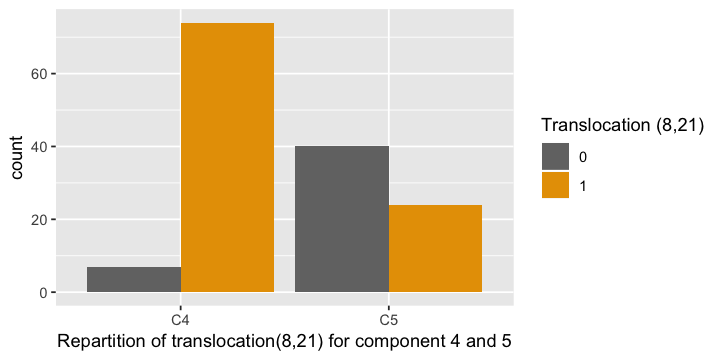

In [36]:
study_c4_5 <- df_refine[df_refine$final_component == "C4" | df_refine$final_component == "C5",]
paste("There are ",dim(study_c4_5)[1],"patients total in component 4 and 5")
paste("with " ,dim(study_c4_5[study_c4_5$final_component=="C4" & study_c4_5$t_8_21==1,])[1],"patients in component 4 with t_8_21")
paste("with " ,dim(study_c4_5[study_c4_5$final_component=="C5" & study_c4_5$t_8_21==1,])[1],"patients in component 5 with t_8_21")
ggplot(study_c4_5)+geom_bar(aes(x=factor(final_component),fill=factor(t_8_21)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of translocation(8,21) for component 4 and 5")+guides(fill=guide_legend("Translocation (8,21)"))

#### Let's set up final rule for component 4 and 5 : if translocation(8,21): C4_5_t_8_21 else : C4_5_others

In [37]:
df_refine[df_refine$final_component=="C4" | df_refine$final_component=="C5",]$final_component <- apply(df_refine[df_refine$final_component=="C4" | df_refine$final_component=="C5",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['t_8_21']==1,"C4_5_t_8_21","C4_5_others"))
    })
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98              9              1 
  not_assigned 
           884 

##### Let's look at if any patients in predicted component 4 or 5 are NPM1 mutated and check if they have the translocation(8,21) to assign second final component if it is the case. (it is not)

In [38]:
df_refine[(df_refine$predicted_component=="C4" | df_refine$predicted_component=="C5") & df_refine$NPM1==1,'t_8_21']


[1] 0

<a id='summary4-5'></a>
##### Summary Component 4-5:
##### We started initially after removing NPM1 mutated cases with 80 in Component 4 and 61 in Component 5 to which we added 1 patient in component 4
##### coming from reassignment and 5 in component 5 coming as well from reassignment.
##### After that, we merged patients in those 2 components with translocation(8,21) to form 2 new components : C4_5 with t(8,21) and C4_5 without.

# 6- Refining C6

#### We will assign all patients in this component with bi allelic CEBPA and try to reassign others.

In [39]:
df_refine[df_refine$predicted_component=="C6" & df_refine$final_component=="not_assigned",]$final_component <- "C6"
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             57              1 
  not_assigned 
           836 

# Let's first look at the repartition of bi allelic CEBPA within this component.

[1] "There are  57 patients total in component 6"

[1] "with  37 patients in component 6 with bi allelic CEBPA"

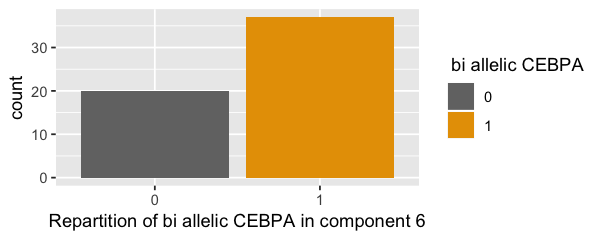

In [40]:
study_c6 <- df_refine[df_refine$final_component=="C6",]
paste("There are ",dim(study_c6)[1],"patients total in component 6")
set_notebook_plot_size(5,2)
paste("with " ,dim(study_c6[study_c6$CEBPA_bi==1,])[1],"patients in component 6 with bi allelic CEBPA")
ggplot(study_c6)+geom_bar(aes(x=factor(CEBPA_bi),fill=factor(CEBPA_bi)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of bi allelic CEBPA in component 6")+guides(fill=guide_legend(" bi allelic CEBPA"))

# Let's look at the repartition of the second predicted component for patients in component 6 without bi allelic CEBPA

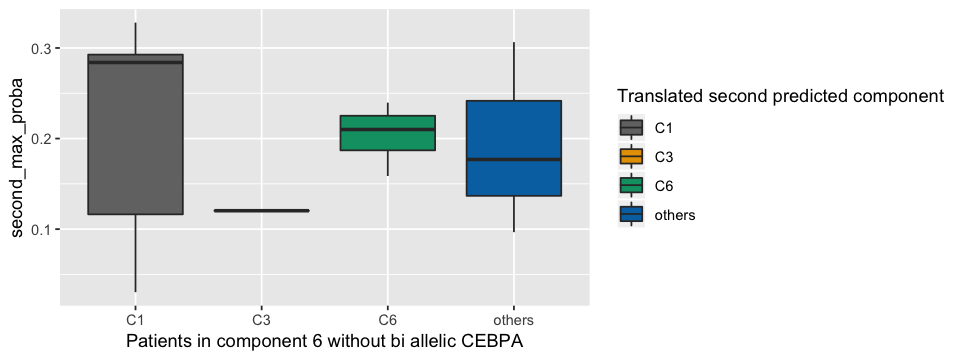

In [41]:
set_notebook_plot_size(8,3)
ggplot(study_c6[study_c6$CEBPA_bi==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("Patients in component 6 without bi allelic CEBPA")

In [42]:
study_c6[study_c6$CEBPA_bi==0 & study_c6$translated_second_predicted_component=="C3",c('rare_fusion','complex','t11','t_15_17')]

,rare_fusion,complex,t11,t_15_17
PD22876c,0,0,0,0


##### They will all go to the not_assigned component because we have already reassigned all patients in Component 1. For component 3, the patient do not have any of the translocation 11 nor 15,17 nor rare fusion nor complex and there are some that 
##### are predicted into component 6 because they were already reassigned to this component so it is their second predicted component. For others, it is an other clustering so we can not reassign them.

In [43]:
df_refine[df_refine$final_component=="C6",]$final_component <- apply(df_refine[df_refine$final_component=="C6",], 1,function(x) {
        if (all(is.na(x['final_component'])))
            return(NaN)
        else 
            return(ifelse(x['CEBPA_bi']==1,"C6","not_assigned"))
    })

In [44]:
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              1 
  not_assigned 
           856 

##### Let's look at patients in predicted component C6 with NPM1 and try to assign second final component. No one.

In [45]:
dim(df_refine[df_refine$predicted_component=="C6"  & df_refine$NPM1==1,])

[1]   0 163

<a id='summary6'></a>
#### Summary Component 6 :
##### We have kept people that were initially assigned to this component as well as the ones that were reassigned with their second predicted component only with bi allelic CEBPA.
##### There are 37 patients in component 6 with bi alllelic CEBPA . The others (20 patients) are put in component not assigned.

# 7- Refining C7

##### For this component , we will follow the WHO classification for inv3 and mark all patients in this component with inv3 and try to reassign the others

#### Let's first look at the repartition of inv3 within this component and after look at the repartition of the second predicted component for patients initially in this component without without inv3

In [46]:
df_refine[df_refine$predicted_component=="C7",]$final_component <- "C7"
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            243             44             15             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37             28 
  not_assigned 
           829 

[1] "There are  28 patients total in component 7"

[1] "with  8 patients in component 7 with inv3"

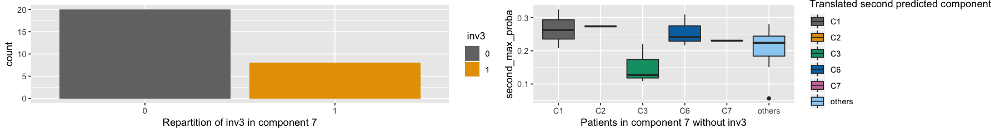

In [47]:
study_c7 <- df_refine[df_refine$final_component=="C7",]
set_notebook_plot_size(15,2)
paste("There are ",dim(study_c7)[1],"patients total in component 7")
paste("with " ,dim(study_c7[study_c7$inv_3==1,])[1],"patients in component 7 with inv3")
p1 <- ggplot(study_c7)+geom_bar(aes(x=factor(inv_3),fill=factor(inv_3)),position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00"))+
xlab("Repartition of inv3 in component 7")+guides(fill=guide_legend(" inv3"))
p2 <- ggplot(study_c7[study_c7$inv_3==0,],aes(x=factor(translated_second_predicted_component),y=second_max_proba,fill=factor(translated_second_predicted_component))) +
    geom_boxplot(aes(fill = factor(translated_second_predicted_component)))+scale_fill_manual(values = c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Translated second predicted component"))+xlab("Patients in component 7 without inv3")
grid.arrange(p1,p2,nrow=1)

#### Let's reassign the ones without inv3 keeping in mind those rules:
#### -it is not possible in C1 
#### -we separated based on the translocations in component 3  (t11,15_17,others)
#### -we need bi allelic CEBPA to reassign to component 6

In [48]:
df_refine[df_refine$final_component=="C7" & df_refine$inv_3==0,]$final_component  <- apply(df_refine[df_refine$final_component=="C7" & df_refine$inv_3==0,], 1,function(x) {
        if (all(is.na(x['translated_second_predicted_component'])))
            return(NaN)
        else 
            return(ifelse(x['translated_second_predicted_component']=="C2" & x['second_max_proba']>=0.75*min_proba_c2,"C2",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t11']==1,"C3_t11",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t_15_17']==1,"C3_t15_17",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t11']==0 & x['t_15_17']==0 & x['rare_fusion']>=1,"C3_rare_fusion",
                   ifelse(x['translated_second_predicted_component']=="C3" & x['second_max_proba']>=0.75*min_proba_c3 & x['t11']==0 & x['t_15_17']==0 & x['rare_fusion']==0 & x['complex']==1,"C2",
                   ifelse(x['translated_second_predicted_component']=="C6" & x['second_max_proba']>=0.75*min_proba_c6 & x['CEBPA_bi']==1,"C6","not_assigned")))))))
    })


In [49]:
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           682            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
  not_assigned 
           847 

<a id='summary7'></a>
#### Summary Component 7: 
##### In component 7, we have kept patients with inv3 (8 patients) and reassigned the 20 other patients if it was possible keeping in mind the specific rules established previously.
##### For the 20 patients to reassign, we have been able to reassign one in component 2 and one in C3 rare fusion.

# 8- Component 8

##### Note: We have reassigned two patients from component 1 to this component because the comutation seems to be more impactful.

In [50]:
df_refine[df_refine$predicted_component =="C8",c("BAGE3","KMT2C")]

,BAGE3,KMT2C
PD20112a,1,1
PD22660a,1,1
PD22943a,1,1
PD23112c,1,1
PD23136a,1,1
PD25061a,1,1
PD25160c,1,1
PD25295c,1,1


In [51]:
df_refine[df_refine$predicted_component =="C8",]$final_component <- "C8"

In [52]:
table(df_refine$final_component)
table(df_refine$second_final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
            C8   not_assigned 
             8            841 


            C2 C3_rare_fusion   not_assigned 
             4              2           2088 

In [53]:
# Let's assign the second final component for those 2 patients:
df_refine[df_refine$final_component=="C8" & df_refine$NPM1==1,]$second_final_component <- "C1"

<a id='summary8'></a>
#### Summary Component 8: 
##### This component is clearly identified as comutations BAGE 3 and KMT2C activated together for all patients and all the patients with those 2 mutations are in this component so we do not touch component 8. We have assign second final component to the cases with the NPM1 mutation

# 9- New Components 1 to 7

# NC 1 ,2 ,3

##### For those new components, we will first look at the main contributors .
##### We will first allocate final component to the predicted component and go more into the details of the contributors.
##### NC1 TO NC3 are splicing chromosome components

In [54]:
for (comp in c("NC1","NC2","NC3","NC4","NC5","NC6","NC7")){
    df_refine[df_refine$predicted_component==comp & df_refine$final_component=="not_assigned","final_component"] <- comp
    df_refine[df_refine$predicted_component==comp & df_refine$NPM1==1,"second_final_component"] <- comp
}
df_refine$final_component_numeric <- as.numeric(factor(df_refine$final_component))

In [55]:
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
            C8            NC1            NC2            NC3            NC4 
             8            298            169             51             58 
           NC5            NC6            NC7   not_assigned 
            30             39              5            191 

In [56]:
table(df_refine$second_final_component)


            C1             C2 C3_rare_fusion            NC1            NC2 
             2              4              2              6              1 
  not_assigned 
          2079 

In [57]:
# Useful function for main contributors
cols_to_keep = c(1:150,155,156,164)
tmp_cat <- as.data.frame(sapply(df_refine[,cols_to_keep], as.numeric))
categories_repartition <- data.frame(category = colnames(tmp_cat[1:(length(tmp_cat)-1)]))
for (i in 1:length(levels(factor(df_refine$final_component))))
    categories_repartition[levels(factor(df_refine$final_component))[i]] <- apply(categories_repartition, 1, function(s) sum(tmp_cat[tmp_cat$final_component_numeric == i, s['category']]))
categories_repartition['total_count'] <- rowSums(categories_repartition[,-1])
main_contributors_analysis <- function(component_name,threshold=0.2){
    cat(paste("Number of patients in this component : ",dim(df_refine[df_refine$final_component==component_name,])[1]),"\n")
    cat(paste("Table with the most frequent features for this component in decreasing order :"),"\n")
    tmp <-categories_repartition[categories_repartition[,component_name]>=threshold*dim(df_refine[df_refine$final_component==component_name,])[1],c("category",component_name)]
    return(tmp[order(tmp[,component_name],decreasing=T),])
    }

intersect(main_contributors_analysis("NC1",0.1)$category,main_contributors_analysis("NC2",0.1)$category)
intersect(main_contributors_analysis("NC1",0.1)$category,main_contributors_analysis("NC3",0.1)$category)
intersect(main_contributors_analysis("NC2",0.1)$category,main_contributors_analysis("NC3",0.1)$category)
main_contributors_analysis("NC1",0.1)
main_contributors_analysis("NC2",0.1)
main_contributors_analysis("NC3",0.1)

Number of patients in this component :  298 
Table with the most frequent features for this component in decreasing order : 
Number of patients in this component :  169 
Table with the most frequent features for this component in decreasing order : 


[1] "TET2"   "RUNX1"  "DNMT3A" "BCOR"

Number of patients in this component :  298 
Table with the most frequent features for this component in decreasing order : 
Number of patients in this component :  51 
Table with the most frequent features for this component in decreasing order : 


[1] "SRSF2"       "RUNX1"       "add_8"       "IDH2_p.R140" "DNMT3A"

Number of patients in this component :  169 
Table with the most frequent features for this component in decreasing order : 
Number of patients in this component :  51 
Table with the most frequent features for this component in decreasing order : 


[1] "RUNX1"  "MLL"    "DNMT3A" "IDH1"

Number of patients in this component :  298 
Table with the most frequent features for this component in decreasing order : 


,category,NC1
75,SRSF2,154
79,TET2,140
66,RUNX1,131
1,ASXL1,102
76,STAG2,88
54,NRAS_p.G12_13,70
84,add_8,47
33,IDH2_p.R140,43
23,EZH2,42
43,KRAS,42


Number of patients in this component :  169 
Table with the most frequent features for this component in decreasing order : 


,category,NC2
66,RUNX1,92
25,ITD,73
46,MLL,72
20,DNMT3A,63
81,U2AF1,49
6,BCOR,42
57,PHF6,28
70,SF3B1,24
32,IDH1,22
79,TET2,22


Number of patients in this component :  51 
Table with the most frequent features for this component in decreasing order : 


,category,NC3
75,SRSF2,43
66,RUNX1,30
20,DNMT3A,27
33,IDH2_p.R140,21
86,add_13,15
32,IDH1,12
84,add_8,10
87,add_21,8
151,complex,7
46,MLL,6


<img src="overview.png">

### Rules for refining NC1 ,2 and 3:
##### In order to keep a patient as NC1 , 2 possibilities:

##### 1)    patient has individual feature of NC1 (ASXL1 or STAG2)
##### 2)    patient need to : share feature with NC2 that NC2 do not share with NC3(TET2 or BCOR)  AND share feature with NC3 that NC3 do not share with NC2(SRSF2 and IDH2_p.R140)

In [58]:
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
            C8            NC1            NC2            NC3            NC4 
             8            298            169             51             58 
           NC5            NC6            NC7   not_assigned 
            30             39              5            191 

 NC1 to keep , move : 201 97 
 NC2 to keep , move : 118 51 
 NC3 to keep , move : 39 12

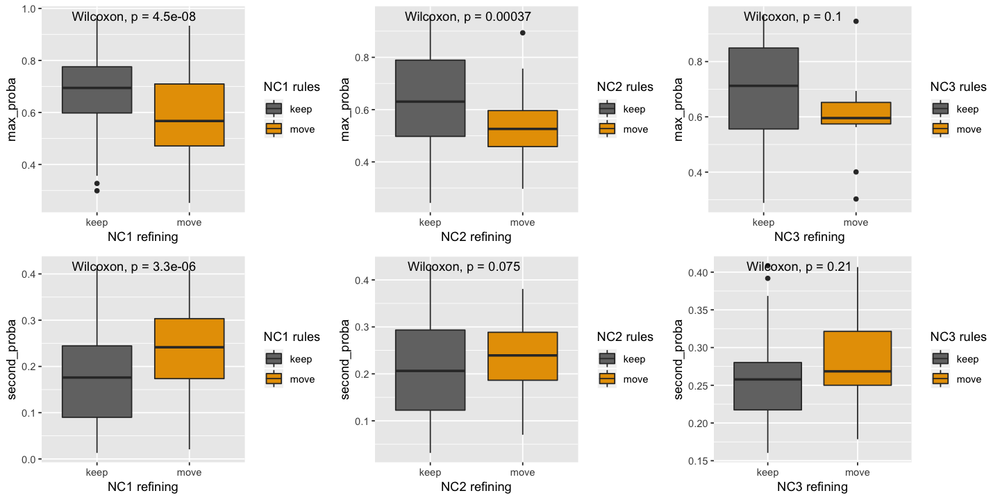

In [59]:
k <- read.table("second_proba_new_components.tsv")


study_nc1 <- merge(df_refine[df_refine$final_component=='NC1',],k[k$init_predicted=="NC1",],by=0)
study_nc1$comparison <- ifelse(!((study_nc1$ASXL1==1 | study_nc1$STAG2==1) |
                                                  ((study_nc1$TET2==1 | study_nc1$BCOR==1) & (study_nc1$SRSF2==1 | study_nc1$IDH2_p.R140==1))) ,"move","keep")

study_nc2 <- merge(df_refine[df_refine$final_component=='NC2',],k[k$init_predicted=="NC2",],by=0)
study_nc2$comparison <- ifelse(study_nc2$final_component=="NC2" &!((study_nc2$ITD==1 | study_nc2$U2AF1==1) | (rowSums(study_nc2[,c('MLL','BCOR','PHF6','SF3B1')])>1)) ,"move","keep")
study_nc3 <- merge(df_refine[df_refine$final_component=='NC3',],k[k$init_predicted=="NC3",],by=0)
study_nc3$comparison <- ifelse(!((study_nc3$add_8==1 | study_nc3$add_13==1 | study_nc3$add_21==1 | study_nc3$complex==1 | study_nc3$del_7==1) |
                                                  ((study_nc3$SRSF2==1 | study_nc3$IDH2_p.R140==1) & (study_nc3$MLL==1 | study_nc3$IDH1==1))),"move","keep")

set_notebook_plot_size(12,6)
p1 <- ggplot(study_nc1,aes(x=factor(comparison),y=max_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC1 rules"))+
    xlab("NC1 refining")+stat_compare_means()

p2 <- ggplot(study_nc2,aes(x=factor(comparison),y=max_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC2 rules"))+
    xlab("NC2 refining")+stat_compare_means()

p3 <- ggplot(study_nc3,aes(x=factor(comparison),y=max_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC3 rules"))+
    xlab("NC3 refining")+stat_compare_means()

p4 <- ggplot(study_nc1,aes(x=factor(comparison),y=second_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC1 rules"))+
    xlab("NC1 refining")+stat_compare_means()

p5 <- ggplot(study_nc2,aes(x=factor(comparison),y=second_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC2 rules"))+
    xlab("NC2 refining")+stat_compare_means()

p6 <- ggplot(study_nc3,aes(x=factor(comparison),y=second_proba,fill=factor(comparison))) +
    geom_boxplot(aes(fill = factor(comparison)))+scale_fill_manual(values = c("grey45", "#e79f00" ))+guides(fill=guide_legend("NC3 rules"))+
    xlab("NC3 refining")+stat_compare_means()
cat(" NC1 to keep , move :",table(study_nc1$comparison),"\n","NC2 to keep , move :",table(study_nc2$comparison),"\n","NC3 to keep , move :",table(study_nc3$comparison))
grid.arrange(p1,p2,p3,p4,p5,p6,nrow=2)

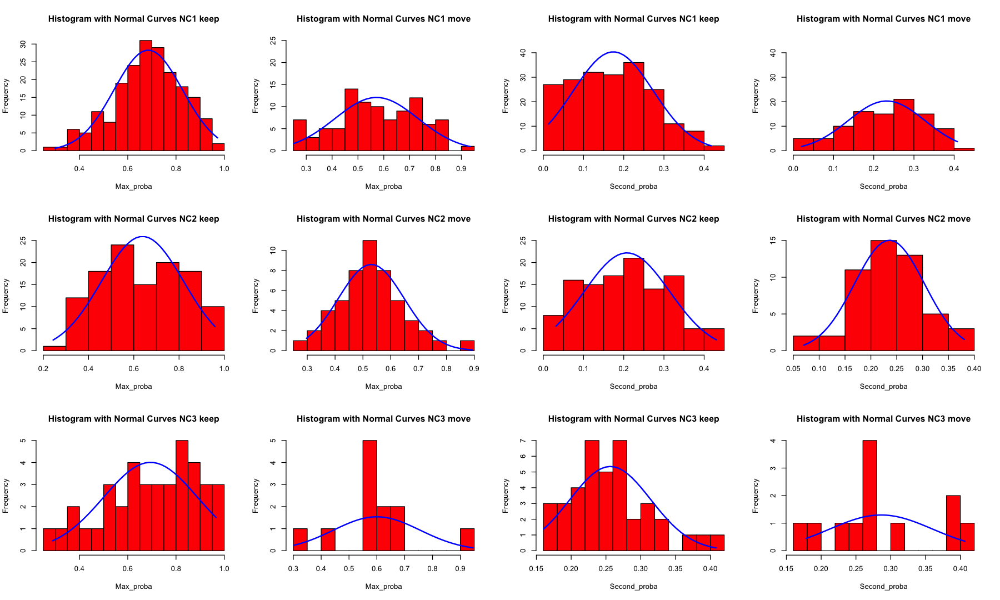

In [60]:
# Why Wilcoxon test and not t - test?
#curve(dnorm(study_nc1[study_nc1$comparison=="keep",]$max_proba), add=TRUE)
set_notebook_plot_size(15,9)
par(mfrow =c(3,4))

#NC1
x <- study_nc1[study_nc1$comparison=="keep",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba", 
   main="Histogram with Normal Curves NC1 keep") 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc1[study_nc1$comparison=="move",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba",main="Histogram with Normal Curves NC1 move",ylim=c(0,25)) 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc1[study_nc1$comparison=="keep",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba", 
   main="Histogram with Normal Curves NC1 keep",ylim=c(0,45)) 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
p1<- lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc1[study_nc1$comparison=="move",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba",main="Histogram with Normal Curves NC1 move",ylim=c(0,45)) 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
p2 <- lines(xfit, yfit, col="blue", lwd=2)

#NC2
x <- study_nc2[study_nc2$comparison=="keep",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba",main="Histogram with Normal Curves NC2 keep",ylim=c(0,25)) 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc2[study_nc2$comparison=="move",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba",main="Histogram with Normal Curves NC2 move")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc2[study_nc2$comparison=="keep",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba",main="Histogram with Normal Curves NC2 keep",ylim=c(0,25)) 
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc2[study_nc2$comparison=="move",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba",main="Histogram with Normal Curves NC2 move")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

#NC3
x <- study_nc3[study_nc3$comparison=="keep",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba",main="Histogram with Normal Curves NC3 keep")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc3[study_nc3$comparison=="move",]$max_proba 
h<-hist(x, breaks=10, col="red", xlab="Max_proba",main="Histogram with Normal Curves NC3 move")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc3[study_nc3$comparison=="keep",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba",main="Histogram with Normal Curves NC3 keep")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

x <- study_nc3[study_nc3$comparison=="move",]$second_proba 
h<-hist(x, breaks=10, col="red", xlab="Second_proba",main="Histogram with Normal Curves NC3 move")
xfit<-seq(min(x),max(x),length=40) 
yfit<-dnorm(xfit,mean=mean(x),sd=sd(x)) 
yfit <- yfit*diff(h$mids[1:2])*length(x) 
lines(xfit, yfit, col="blue", lwd=2)

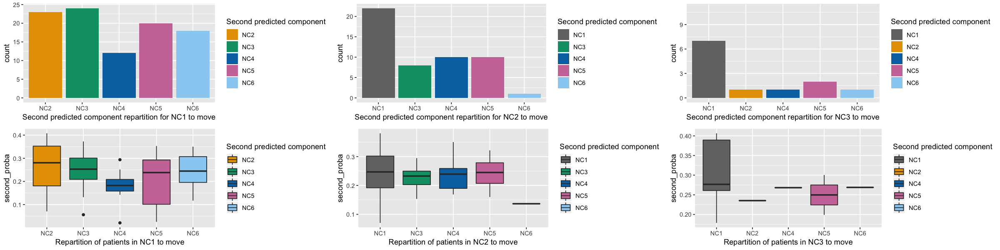

In [61]:
set_notebook_plot_size(20,5)
p1 <- ggplot(study_nc1[study_nc1$comparison=="move",]) +
geom_bar(aes(x = as.factor(second_predicted), fill = as.factor(second_predicted)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
xlab("Second predicted component repartition for NC1 to move")+guides(fill=guide_legend("Second predicted component"))
p2 <- ggplot(study_nc2[study_nc2$comparison=="move",]) +
geom_bar(aes(x = as.factor(second_predicted), fill = as.factor(second_predicted)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
xlab("Second predicted component repartition for NC2 to move")+guides(fill=guide_legend("Second predicted component "))
p3 <- ggplot(study_nc3[study_nc3$comparison=="move",]) +
geom_bar(aes(x = as.factor(second_predicted), fill = as.factor(second_predicted)), position = "dodge", stat = "count")+
scale_fill_manual(values = c("grey45", "#e79f00","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
xlab("Second predicted component repartition for NC3 to move")+guides(fill=guide_legend("Second predicted component "))+ylim(0,11)
p4 <- ggplot(study_nc1[study_nc1$comparison=="move",],aes(x=factor(second_predicted),y=second_proba,fill=factor(second_predicted))) +
    geom_boxplot(aes(fill = factor(second_predicted)))+scale_fill_manual(values = c("#e79f00", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Second predicted component"))+xlab("Repartition of patients in NC1 to move")
p5 <- ggplot(study_nc2[study_nc2$comparison=="move",],aes(x=factor(second_predicted),y=second_proba,fill=factor(second_predicted))) +
    geom_boxplot(aes(fill = factor(second_predicted)))+scale_fill_manual(values = c("grey45", "#009E73","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Second predicted component"))+xlab("Repartition of patients in NC2 to move")
p6 <- ggplot(study_nc3[study_nc3$comparison=="move",],aes(x=factor(second_predicted),y=second_proba,fill=factor(second_predicted))) +
    geom_boxplot(aes(fill = factor(second_predicted)))+scale_fill_manual(values = c("grey45", "#e79f00","#0072B2",  "#CC79A7",
                                      "#9ad0f3", "#D55E00","lightskyblue","mistyrose4", "darkseagreen","lightgoldenrod","lightsalmon","#F0E442","firebrick3","#000000"))+
                                    guides(fill=guide_legend("Second predicted component"))+xlab("Repartition of patients in NC3 to move")
grid.arrange(p1,p2,p3,p4,p5,p6,nrow=2)

In [62]:
# Now , we create a component NC_splicing in order to put patients not belonging in NC1 ,2 or 3 with splicing factors.

In [63]:
splicing_factors <- c("ZRSR2","U2AF1","SRSF2","SF3B1","ASXL1","STAG2","BCOR","RUNX1","EZH2","MLL","PHF6","SF1")

df_refine[df_refine$final_component=="NC1" &
          !((df_refine$ASXL1==1 | df_refine$STAG2==1) |((df_refine$TET2==1 | df_refine$BCOR==1) & (df_refine$SRSF2==1 | df_refine$IDH2_p.R140==1))) &
          (rowSums(df_refine[,splicing_factors])>0) ,]$final_component <- "NC_splicing"

df_refine[df_refine$final_component=="NC1" &
          !((df_refine$ASXL1==1 | df_refine$STAG2==1) |((df_refine$TET2==1 | df_refine$BCOR==1) & (df_refine$SRSF2==1 | df_refine$IDH2_p.R140==1))) &
          !(rowSums(df_refine[,splicing_factors])>0) ,]$final_component <- "not_assigned"

df_refine[df_refine$final_component=="NC2" & 
          !((df_refine$ITD==1 | df_refine$U2AF1==1) | (rowSums(df_refine[,c('MLL','BCOR','PHF6','SF3B1')])>1)) &
          (rowSums(df_refine[,splicing_factors])>0),]$final_component <- "NC_splicing"

df_refine[df_refine$final_component=="NC2" & 
          !((df_refine$ITD==1 | df_refine$U2AF1==1) | (rowSums(df_refine[,c('MLL','BCOR','PHF6','SF3B1')])>1)) &
          !(rowSums(df_refine[,splicing_factors])>0),]$final_component <- "not_assigned"

df_refine[df_refine$final_component=="NC3" &
          !((df_refine$add_8==1 | df_refine$add_13==1 | df_refine$add_21==1 | df_refine$complex==1 | df_refine$del_7==1) |((df_refine$SRSF2==1 | df_refine$IDH2_p.R140==1) & (df_refine$MLL==1 | df_refine$IDH1==1))) &
          (rowSums(df_refine[,splicing_factors])>0),]$final_component <- "NC_splicing"

df_refine[df_refine$final_component=="NC3" &
          !((df_refine$add_8==1 | df_refine$add_13==1 | df_refine$add_21==1 | df_refine$complex==1 | df_refine$del_7==1) |((df_refine$SRSF2==1 | df_refine$IDH2_p.R140==1) & (df_refine$MLL==1 | df_refine$IDH1==1))) &
          !(rowSums(df_refine[,splicing_factors])>0),]$final_component <- "NC_splicing"


In [64]:
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
            C8    NC_splicing            NC1            NC2            NC3 
             8            138            201            118             39 
           NC4            NC5            NC6            NC7   not_assigned 
            58             30             39              5            213 

# NC4

Keep patients with DNMT3A and IDH2

In [65]:
cat("Patients in NC4 without combination of DNMT3A and IDH2")
tmp <- df_refine[df_refine$final_component=="NC4" &  !(df_refine$DNMT3A==1 & (df_refine$IDH2_p.R140==1 | df_refine$IDH2_p.R172==1)),]
cols_to_keep = c(1:150,155,156,164)
tmp_cat1 <- as.data.frame(sapply(tmp[,cols_to_keep], as.numeric))
categories_repartition1 <- data.frame(category = colnames(tmp_cat1[1:(length(tmp_cat1)-1)]))
categories_repartition1['NC4'] <- apply(categories_repartition1, 1, function(s) sum(tmp_cat1[tmp_cat1$final_component_numeric == 15, s['category']]))
#categories_repartition['total_count'] <- rowSums(categories_repartition[,-1])
head(categories_repartition1[order(categories_repartition1$NC4,decreasing = T),])
main_contributors_analysis("NC4",0.1)
#dim(categories_repartition1)

Patients in NC4 without combination of DNMT3A and IDH2

,category,NC4
34,IDH2_p.R172,8
85,add_11,6
20,DNMT3A,5
32,IDH1,4
26,FLT3_TKD,3
46,MLL,3


Number of patients in this component :  58 
Table with the most frequent features for this component in decreasing order : 


,category,NC4
20,DNMT3A,49
34,IDH2_p.R172,45
85,add_11,12
46,MLL,11
66,RUNX1,8
1,ASXL1,7
33,IDH2_p.R140,7
92,del_7,7
75,SRSF2,6


In [66]:
df_refine[df_refine$final_component=="NC4" &  !(df_refine$DNMT3A==1 & (df_refine$IDH2_p.R140==1 | df_refine$IDH2_p.R172==1)) & (rowSums(df_refine[,splicing_factors])>0),]$final_component <- "NC_splicing"
df_refine[df_refine$final_component=="NC4" &  !(df_refine$DNMT3A==1 & (df_refine$IDH2_p.R140==1 | df_refine$IDH2_p.R172==1)) & !(rowSums(df_refine[,splicing_factors])>0),]$final_component <- "not_assigned"
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             62 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
             9             47             98             37              8 
            C8    NC_splicing            NC1            NC2            NC3 
             8            147            201            118             39 
           NC4            NC5            NC6            NC7   not_assigned 
            44             30             39              5            218 

##### We keep in NC4 patients with both DNMT3A and IDH2 and put patients with DNMT3A only in NC_splicing and others in not assigned.

# NC5

In [67]:
main_contributors_analysis("NC5",0.1)

Number of patients in this component :  30 
Table with the most frequent features for this component in decreasing order : 


,category,NC5
107,t_15_17,10
66,RUNX1,8
25,ITD,5
39,KIT,5
100,t_v_11,4
1,ASXL1,3
20,DNMT3A,3
22,ETV6,3
23,EZH2,3
70,SF3B1,3


In [68]:
df_refine[df_refine$final_component =="NC5" & (df_refine$t_15_17==1 | df_refine$t_v_11==1)  & (rowSums(df_refine[,splicing_factors])>0),]$second_final_component <- "NC_splicing"
df_refine[df_refine$final_component =="NC5" & df_refine$t_v_11==1,]$final_component <- "C3_t11" 
df_refine[df_refine$final_component =="NC5" & df_refine$t_15_17==1,]$final_component <- "C3_t15_17" 
df_refine[df_refine$final_component =="NC5" & (rowSums(df_refine[,splicing_factors])>0) & df_refine$t_v_11==0 & df_refine$t_15_17==0,]$final_component <- "NC_splicing"
df_refine[df_refine$final_component =="NC5" & (rowSums(df_refine[,splicing_factors])==0) & df_refine$t_v_11==0 & df_refine$t_15_17==0,]$final_component <- "not_assigned"
table(df_refine$final_component)

cat("4 patients assigned to C3_t11,10 patients to t15-17,11 to NC_splicing and 5 to not assigned.")


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             66 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
            19             47             98             37              8 
            C8    NC_splicing            NC1            NC2            NC3 
             8            158            201            118             39 
           NC4            NC6            NC7   not_assigned 
            44             39              5            223 

4 patients assigned to C3_t11,10 patients to t15-17,11 to NC_splicing and 5 to not assigned.

##### We will split people from this component into NC splicing, t11 and t15-17 and if overlap we will assign a second final component. At the end, NC5 is no longer a component because we were able to reassign the patients into existing components

##### Finally, we look at patients not assigned and see if they have any splicing factors to assign them to this component

In [69]:
df_refine[df_refine$final_component=="not_assigned" & (rowSums(df_refine[,splicing_factors])>0),]$final_component <- "NC_splicing"
table(df_refine$final_component)


            C1             C2      C3_others C3_rare_fusion         C3_t11 
           680            244             44             16             66 
     C3_t15_17    C4_5_others    C4_5_t_8_21             C6             C7 
            19             47             98             37              8 
            C8    NC_splicing            NC1            NC2            NC3 
             8            187            201            118             39 
           NC4            NC6            NC7   not_assigned 
            44             39              5            194 

In [70]:
df_refine$overlap <-ifelse(df_refine$second_final_component!="not_assigned",1,0)

In [80]:
table(df_refine$second_final_component)


            C1             C2 C3_rare_fusion    NC_splicing            NC1 
             2              4              2              7              6 
           NC2   not_assigned 
             1           2072 

## Summary all refined components:
##### For the initial component, we have refined them based on biological content as well as second predicted component .
##### Regarding the new components, we have mostly refined them based on splicing factors differences for NC1,2,3 and on translocation t11 and t 15-17 for NC5.

##### Note: it is interesting to see that DNMT3A and ITD are frequently mutated for patients not assigned. This comes from the fact that most of those patients are coming from component 1 with NPM1 wt.

# Let's look at feature activation for the new component definitions:

In [71]:
df_refine$final_component_numeric <- as.numeric(factor(df_refine$final_component))

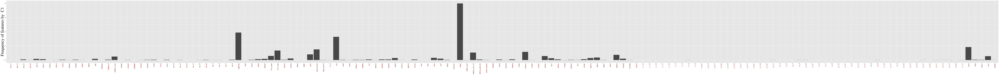

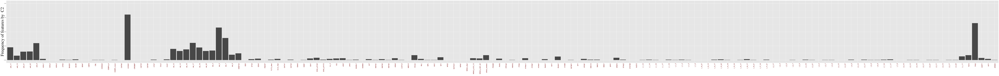

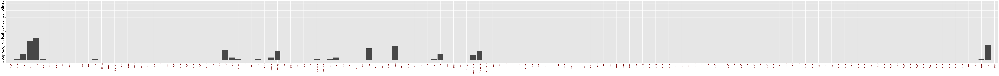

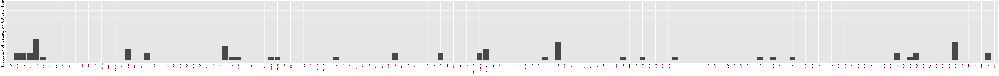

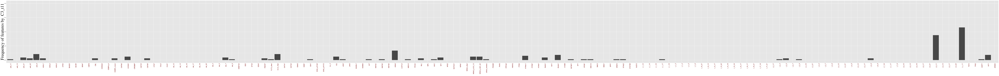

...

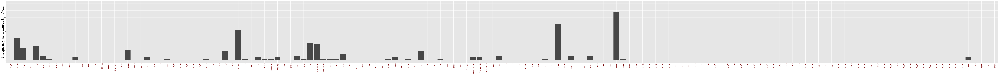

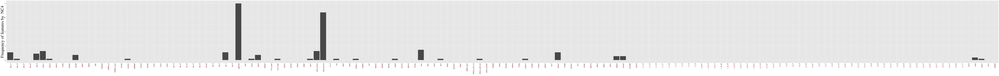

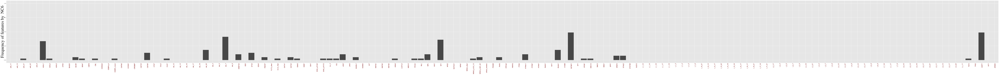

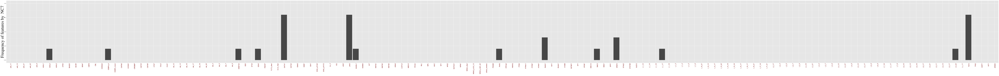

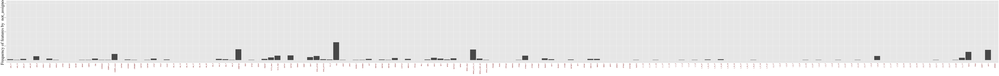

In [72]:
cols_to_keep = c(1:150,155,156,164)
tmp_cat <- as.data.frame(sapply(df_refine[,cols_to_keep], as.numeric))
categories_repartition <- data.frame(category = colnames(tmp_cat))
for (i in 1:length(levels(factor(df_refine$final_component))))
    categories_repartition[sprintf('component_%d', i)] <- apply(categories_repartition, 1, function(s) (sum(tmp_cat[tmp_cat$final_component_numeric == i, s['category']])/nrow(tmp_cat[tmp_cat$final_component_numeric ==i,])))
categories_repartition <- categories_repartition[! categories_repartition$category == "final_component_numeric",]
set_notebook_plot_size(130,10)
i <-1
for (col in colnames(categories_repartition)[-1]){
    plot(ggplot(categories_repartition,aes(factor(category),y=categories_repartition[,col]))+geom_bar(stat='identity')+xlab("")+scale_fill_manual(values="#e79f00")
     +ylab(paste("Frequency of features by ",levels(factor(df_refine$final_component))[i]))+theme(axis.text.x = element_text(angle = 90, hjust = 1, size=13,color="darkred"))
     +theme(axis.title.y = element_text(family="serif", size = 40, angle = 90, vjust = 0.25))+ylim(0,1))
    i <-i+1
    }

In [73]:
df_all_components <- df_refine[,cols_to_keep]
tmp_all <- df_all_components[order(df_all_components$final_component_numeric),]
transp_df_all <-(as.data.frame(t(tmp_all)))
transp_df_all$features <- rownames(transp_df_all)
transp_df_all <- transp_df_all[! row.names(transp_df_all) == "final_component_numeric",]
melt.data_all<-melt(transp_df_all,id.vars ="features", variable_name=colnames(transp_df_all))

Order of Components :C1  , C2  , C3_others  , C3_rare_fusion  , C3_t11  , C3_t15_17  , C4_5_others  , C4_5_t_8_21  , C6  , C7  , C8  , NC_splicing  , NC1  , NC2  , NC3  , NC4  , NC6  , NC7  , not_assigned  ,

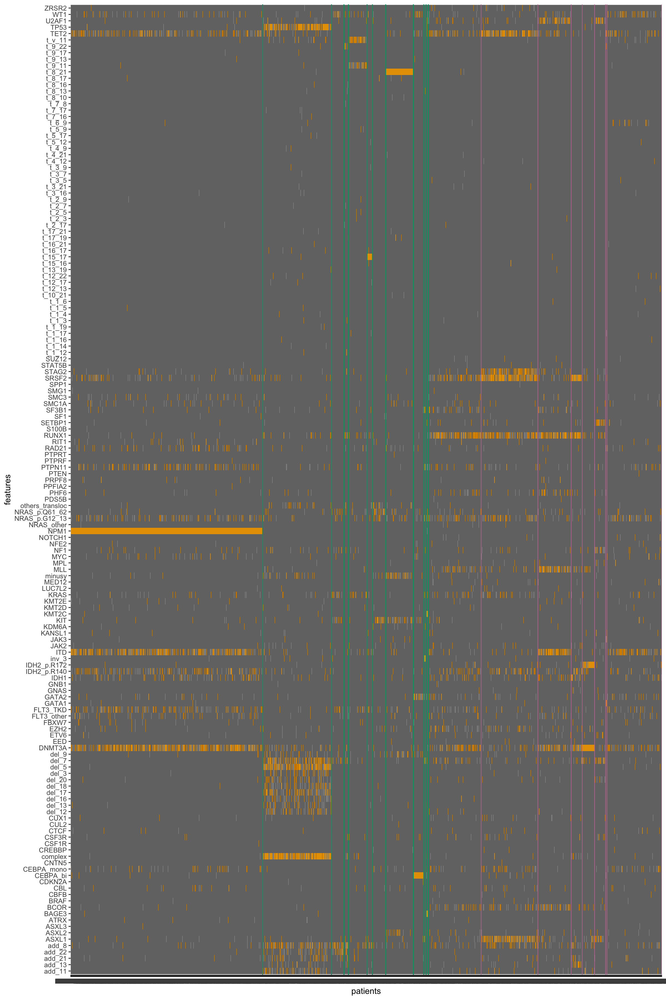

In [74]:
options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_all_components$final_component_numeric)   ## to separate by component
cat("Order of Components :")
cat(paste(levels(factor(df_refine$final_component))," ,"))
# plot the heatmap
ggplot(melt.data_all, aes(variable,features)) +
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c("0" = "grey45", "1" = "#e79f00")) +
geom_vline(xintercept = cumsum(col_sep)[1:11] + 0.5, col = "#009E73", linetype = 1, size = 0.5) +
geom_vline(xintercept = cumsum(col_sep)[12:19] + 0.5, col = "#CC79A7", linetype = 1, size = 0.3) +
labs(x = 'patients') 

In [75]:
w <- df_refine[,c(1:159,162,164,160,161,163)]

In [77]:
#write.table(w,"../../../data/updated_dataset/refined_components_updated.tsv",sep = '\t' , )